In [1]:
import numpy as np
import cv2
import glob
import sys
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
plt.rcParams["figure.figsize"] = (20, 10)

In [3]:
# Number of points in columns and points in rows
nRows = 8
nCols = 6
#the physical dimension of a cell side in mm
dimension = 25 #- mm

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, dimension, 0.001)

#workingFolder   = "./snapshot_calibration/how_do_drones_work-master/opencv/save_snapshots2/"
workingFolder = "./data/save_snapshots2/"
imageType       = 'jpg'

In [4]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((nRows*nCols,3), np.float32)
objp[:,:2] = np.mgrid[0:nCols,0:nRows].T.reshape(-1,2)
objp = objp.reshape(-1, 1, 3)

In [5]:
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

# Find the images files
filename    = workingFolder + "/*." + imageType
images      = glob.glob(filename)

In [6]:
print("Number of images in folder: ", len(images))

Number of images in folder:  24


### View all the image samples

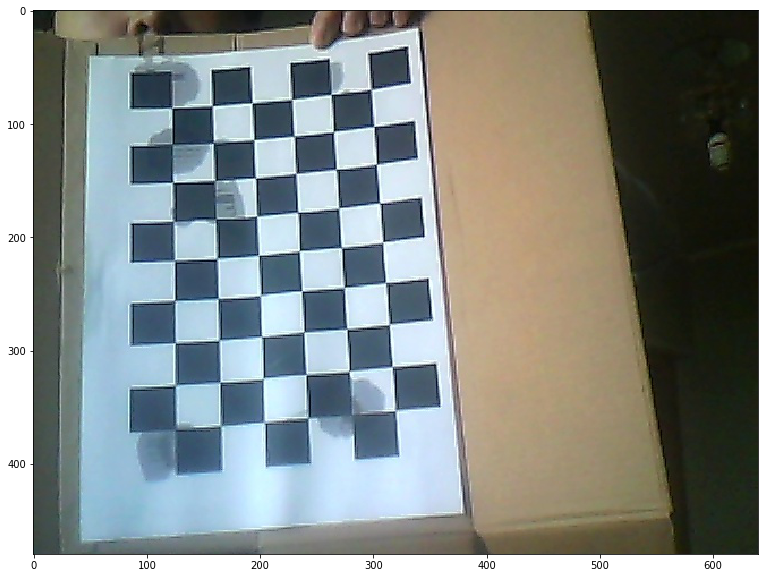

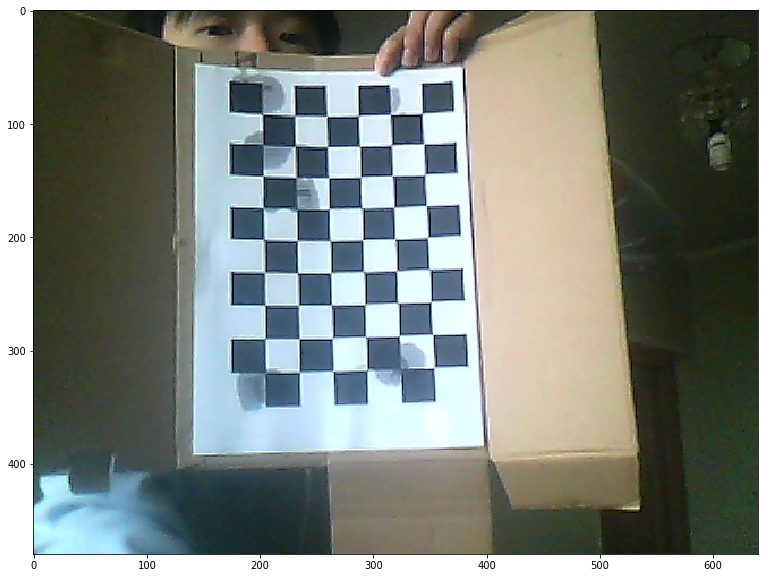

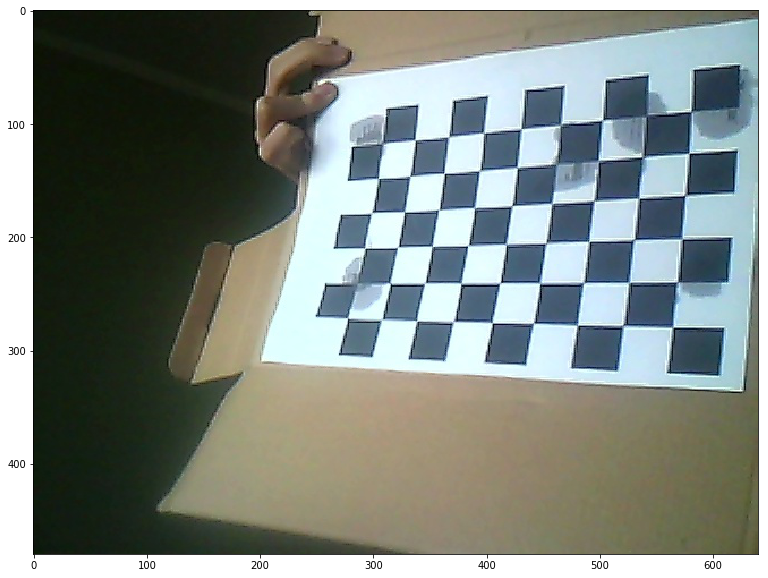

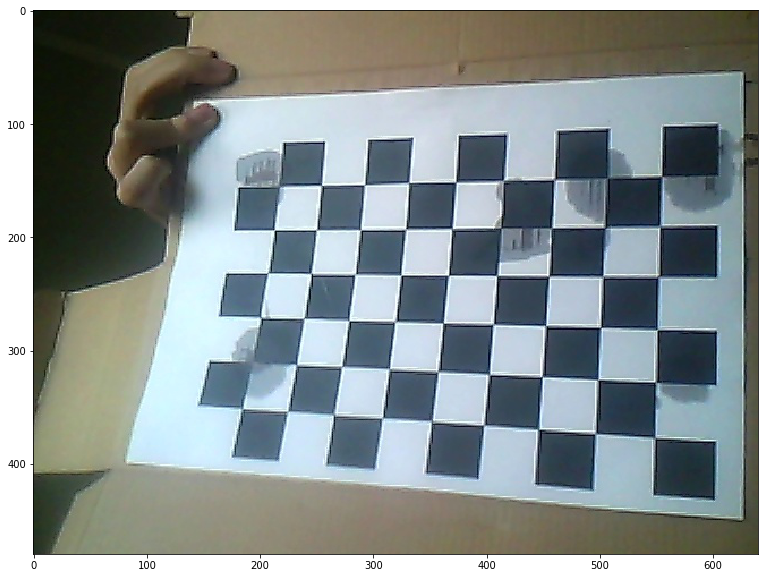

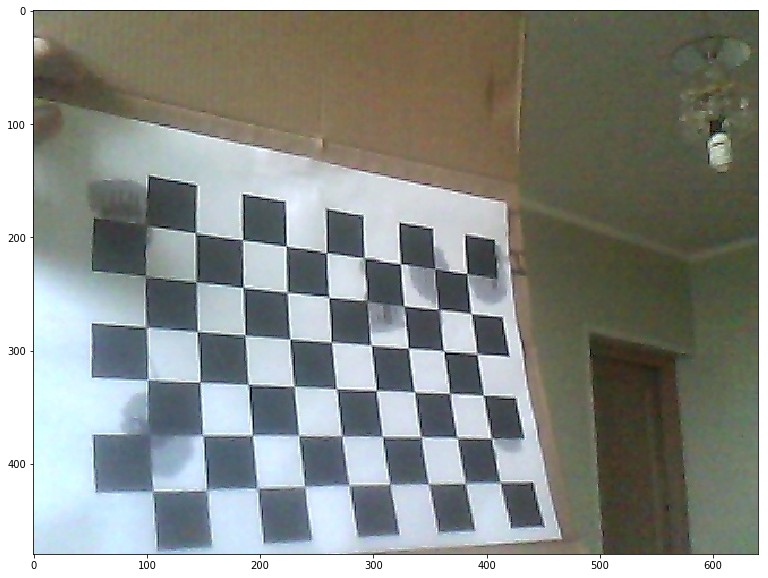

...

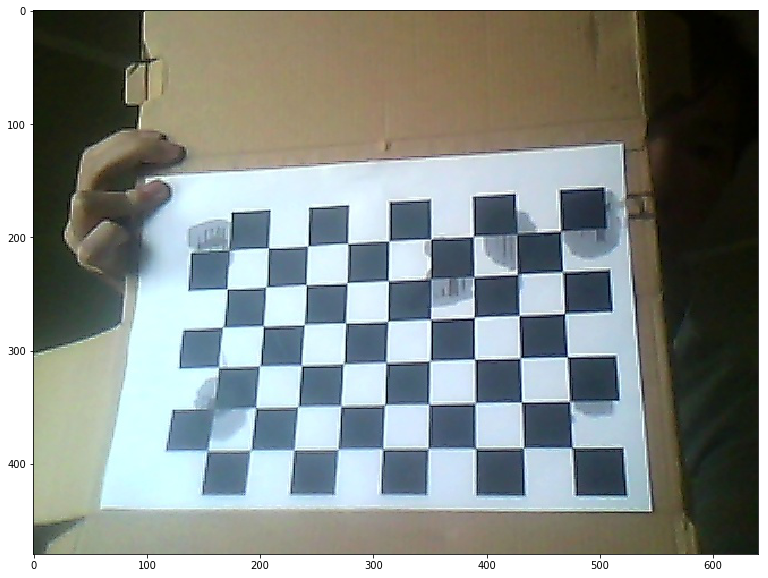

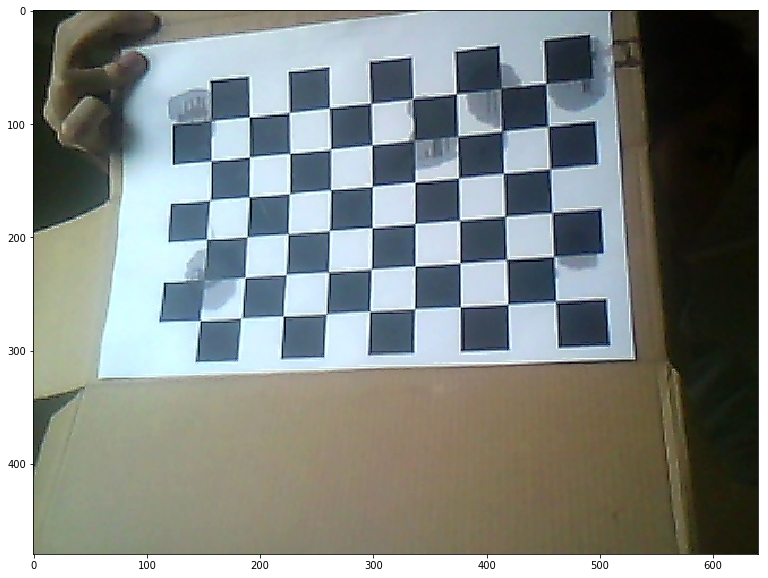

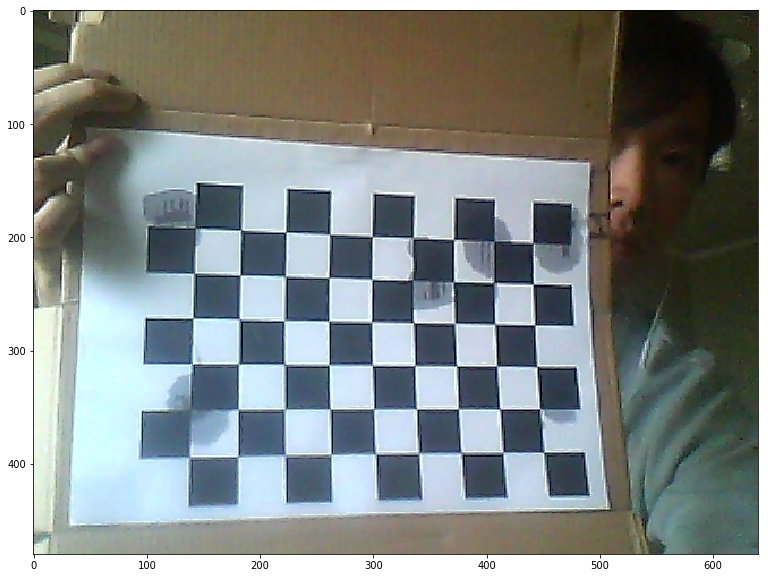

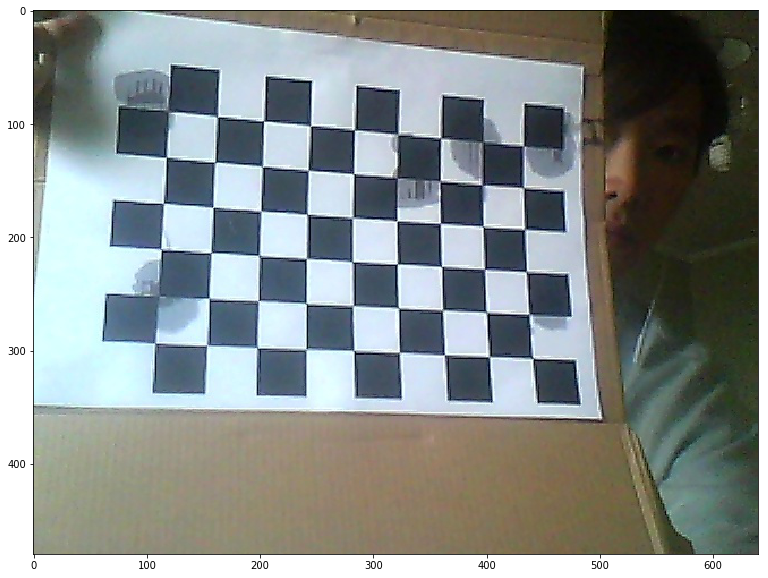

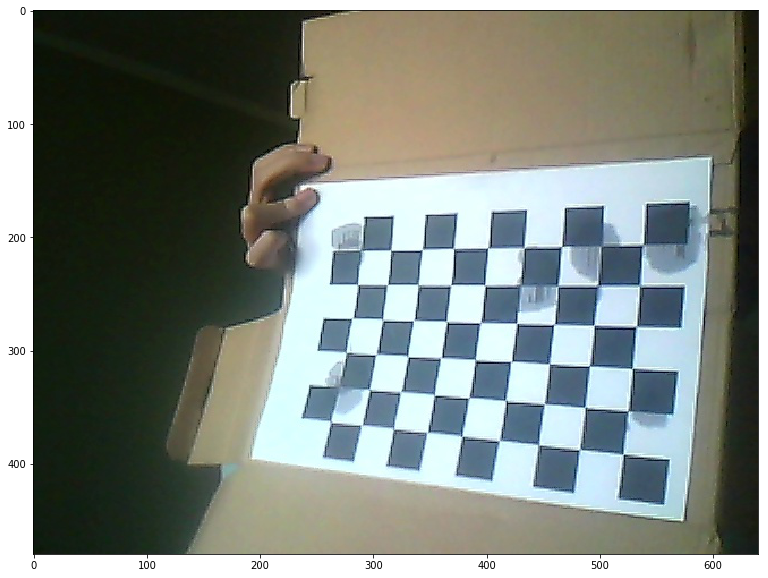

In [7]:
for img in images:
    img = cv2.imread(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

### Extract object points and image points for camera calibration

Reading image  ./data/save_snapshots2\webcam_640_480_0.jpg
True


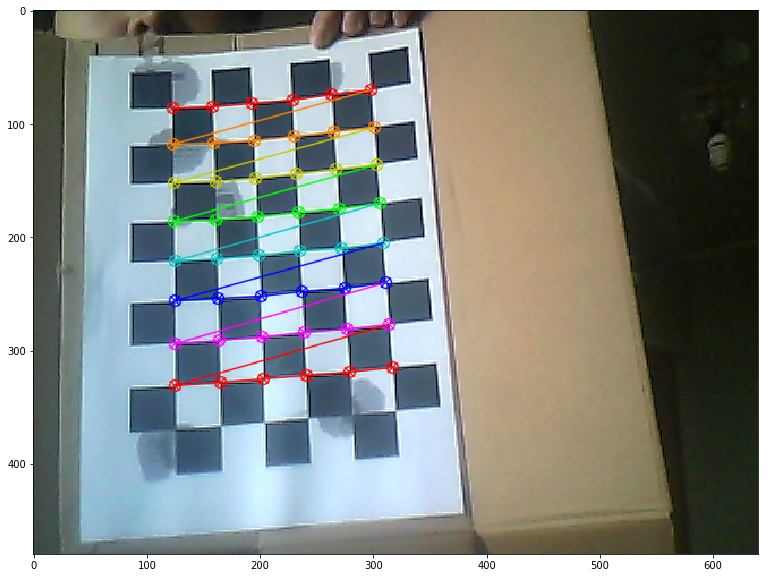

Reading image  ./data/save_snapshots2\webcam_640_480_1.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_10.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_11.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_12.jpg
True


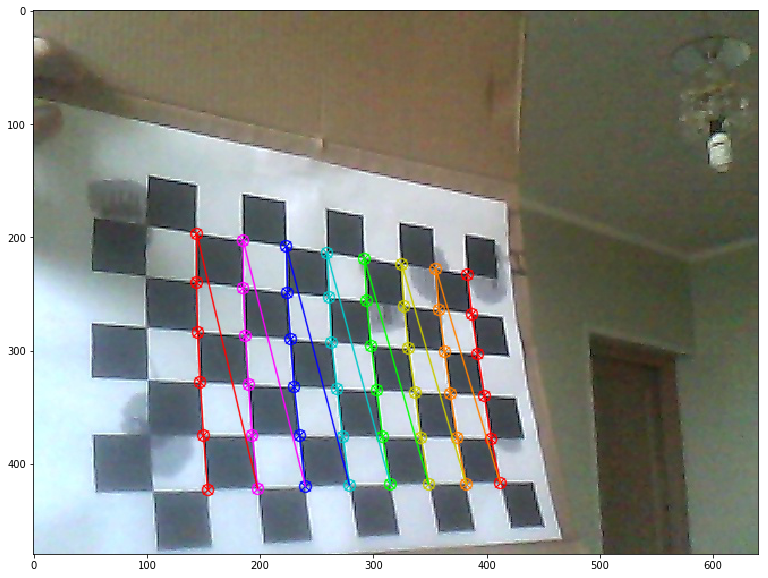

Reading image  ./data/save_snapshots2\webcam_640_480_13.jpg
True


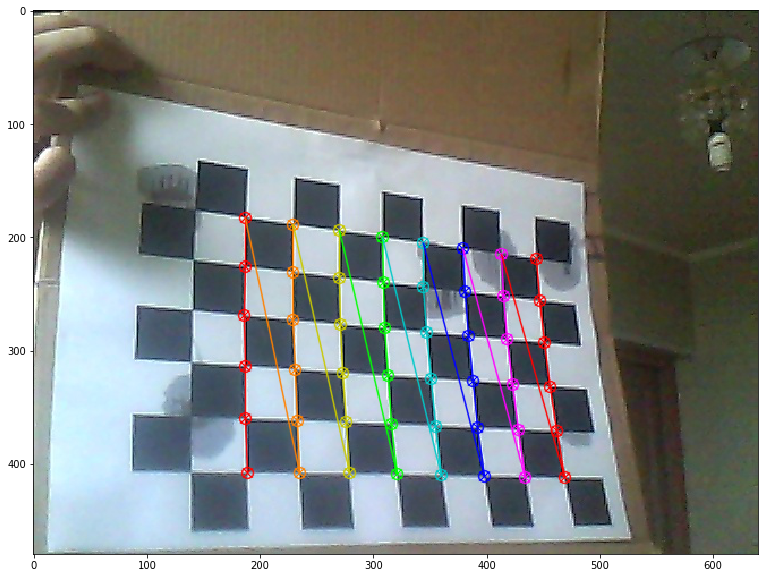

Reading image  ./data/save_snapshots2\webcam_640_480_14.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_15.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_16.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_17.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_18.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_19.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_2.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_20.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_21.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_22.jpg
True


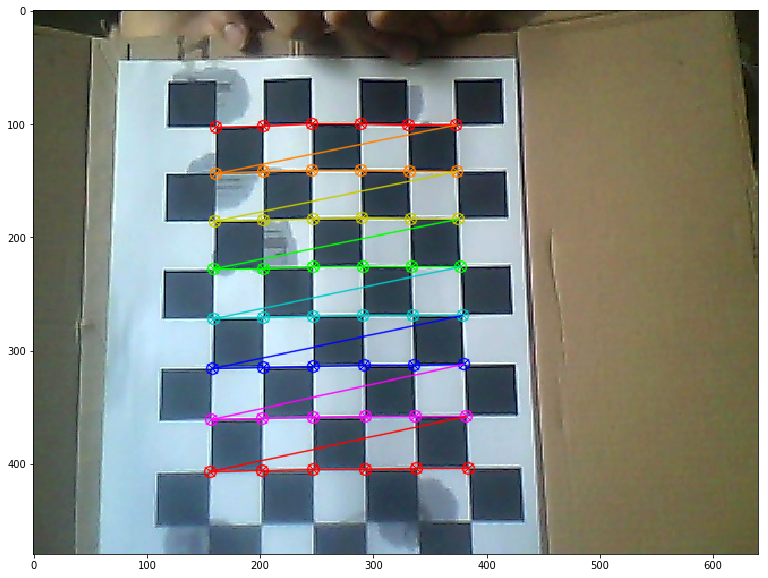

Reading image  ./data/save_snapshots2\webcam_640_480_23.jpg
True


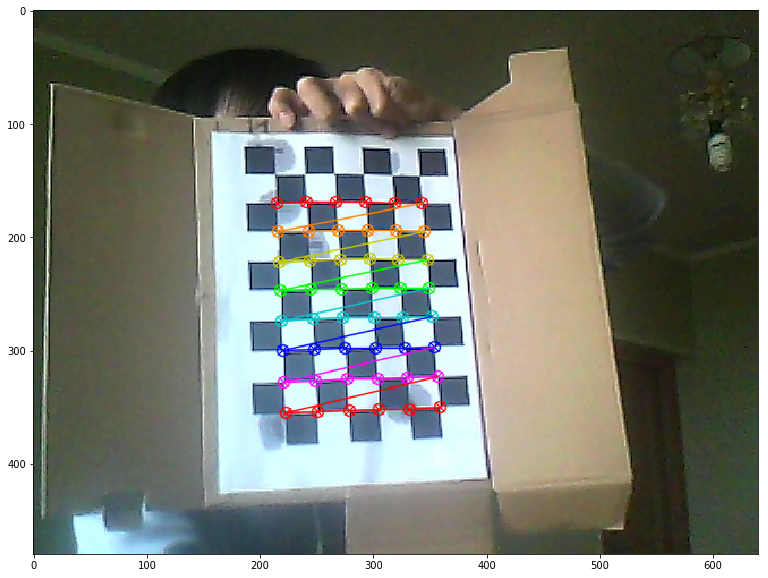

Reading image  ./data/save_snapshots2\webcam_640_480_3.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_4.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_5.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_6.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_7.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_8.jpg
False
Reading image  ./data/save_snapshots2\webcam_640_480_9.jpg
False


In [8]:
nGoodPatternFound = 0
imgForTest = images[0]

for fname in images:
    
    if 'calibresult' in fname: 
        continue
    
    #-- Read the file and convert in greyscale
    img     = cv2.imread(fname)
    
    gray    = cv2.cvtColor(img, 
                           cv2.COLOR_BGR2GRAY)
    
    print ("Reading image ", fname)

    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, 
                                             (nCols,nRows), None)
    print(ret)
    
    # If found, add object points, image points (after refining them)    
    if ret == True: 
        
        nGoodPatternFound += 1
        
        # increase corners accuracy
        corners2 = cv2.cornerSubPix(gray, 
                                    corners,
                                    (8, 8),
                                    (-1,-1),
                                    criteria)

        # Draw and display the corners
        #cv2.drawChessboardCorners(img, (nCols,nRows), corners2,ret)
        cv2.drawChessboardCorners(img, (nCols,nRows), corners, ret)
        
        img_convert = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img_convert)
        plt.show()        
        
        #objpoints.append(objp)
        objpoints.append(objp[0:corners2.shape[0]])
        imgpoints.append(corners2)
        
    else: 
        imgForTest = fname

In [9]:
print("Number of pattern that found: ", nGoodPatternFound)

Number of pattern that found:  5


### Calculate distortion coefficients, and test undistortion on an image

In [10]:
def calculate_distortion(nGoodPatternFound, objpoints, imgpoints, gray, alpha=1, is_crop=None):
    
    if (nGoodPatternFound > 1):
    
        print ("Found %d good images" % (nGoodPatternFound))

        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, 
                                                           imgpoints, 
                                                           gray.shape[::-1],
                                                           None,
                                                           None)

        # Undistort an image
        img = cv2.imread(imgForTest)
        h,  w = img.shape[:2]
        print ("Image to undistort: ", imgForTest)

        #refine the camera matrix 
        #If the scaling parameter alpha=0, it returns undistorted image with minimum unwanted pixels. 
        #So it may even remove some pixels at image corners. 
        # alpha=1, all pixels are retained with some extra black images. It also returns an image ROI which can be used to crop the result.
        newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h), alpha,(w,h), )

        # undistort: Method 1
        mapx,mapy = cv2.initUndistortRectifyMap(mtx, dist, None, newcameramtx,(w,h),5)
        dst = cv2.remap(img, mapx, mapy, cv2.INTER_LINEAR)

        # undistort: Method 2 (fast way)
        #dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

        # crop the image
        x,y,w,h = roi
        if is_crop:
            dst = dst[y:y+h, x:x+w]
        print ("ROI: ", x, y, w, h)

        cv2.imwrite(workingFolder + "/calibresult.png",dst)
        print ("Calibrated picture saved as calibresult.png")
        print ("Calibration Matrix: ")
        print (mtx)
        print ("Disortion: \n", dist)

        #--------- Save result
        filename = workingFolder + "/cameraMatrix.txt"
        np.savetxt(filename, mtx, delimiter=',')
        filename = workingFolder + "/cameraDistortion.txt"
        np.savetxt(filename, dist, delimiter=',')

        mean_error = 0
        for i in range(len(objpoints)):
            imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
            error = cv2.norm(imgpoints[i],imgpoints2, cv2.NORM_L2)/len(imgpoints2)
            mean_error += error

        print ("total error: ", mean_error/len(objpoints))
        return mtx, dist

    else:
        print ("In order to calibrate you need at least 9 good pictures... try again")

    

In [11]:
calculate_distortion(nGoodPatternFound, objpoints, imgpoints, gray, alpha=1, is_crop=False)

Found 5 good images
Image to undistort:  ./data/save_snapshots2\webcam_640_480_9.jpg
ROI:  20 17 608 450
Calibrated picture saved as calibresult.png
Calibration Matrix: 
[[769.96827512   0.         355.59903195]
 [  0.         771.91545226 258.96787846]
 [  0.           0.           1.        ]]
Disortion: 
 [[ 0.10415046 -0.17701593 -0.01359718  0.03910642  3.91840564]]
total error:  0.12352949220895426


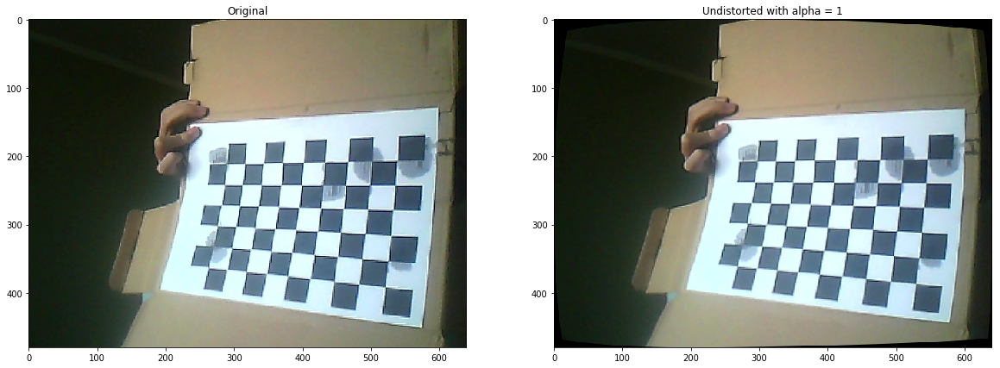

In [12]:
im = cv2.imread(imgForTest)
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

im_undistorted = cv2.imread(workingFolder + "/calibresult.png") #cv2.undistort(im, mtx, dist)
im_undistorted = cv2.cvtColor(im_undistorted, cv2.COLOR_BGR2RGB)

ax = plt.subplot(121)
ax.set_title("Original")
plt.imshow(im)
ax = plt.subplot(122)
ax.set_title("Undistorted with alpha = 1")
plt.imshow(im_undistorted)
plt.show()

In [13]:
calculate_distortion(nGoodPatternFound, objpoints, imgpoints, gray, alpha=0)

Found 5 good images
Image to undistort:  ./data/save_snapshots2\webcam_640_480_9.jpg
ROI:  0 0 640 480
Calibrated picture saved as calibresult.png
Calibration Matrix: 
[[769.96827512   0.         355.59903195]
 [  0.         771.91545226 258.96787846]
 [  0.           0.           1.        ]]
Disortion: 
 [[ 0.10415046 -0.17701593 -0.01359718  0.03910642  3.91840564]]
total error:  0.12352949220895426


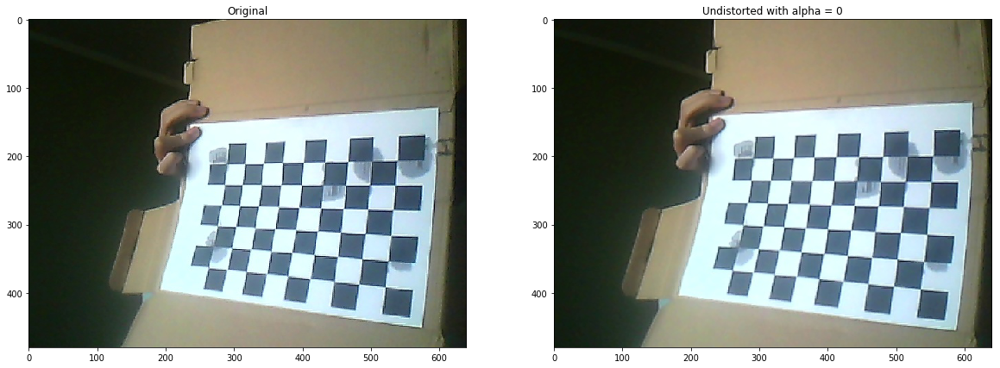

In [14]:
im = cv2.imread(imgForTest)
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

im_undistorted = cv2.imread(workingFolder + "/calibresult.png") #cv2.undistort(im, mtx, dist)
im_undistorted = cv2.cvtColor(im_undistorted, cv2.COLOR_BGR2RGB)

ax = plt.subplot(121)
ax.set_title("Original")
plt.imshow(im)
ax = plt.subplot(122)
ax.set_title("Undistorted with alpha = 0")
plt.imshow(im_undistorted)
plt.show()